In [1]:
#@title Licensed under the Apache License, Version 2.0 (the "License");
# you may not use this file except in compliance with the License.
# You may obtain a copy of the License at
#
# https://www.apache.org/licenses/LICENSE-2.0
#
# Unless required by applicable law or agreed to in writing, software
# distributed under the License is distributed on an "AS IS" BASIS,
# WITHOUT WARRANTIES OR CONDITIONS OF ANY KIND, either express or implied.
# See the License for the specific language governing permissions and
# limitations under the License.

In [2]:
from google.colab import drive
drive.mount('/content/gdrive')
!ln -s /content/gdrive/My\ Drive/ /mydrive
%cd /mydrive/Tensorflow-Models

Drive already mounted at /content/gdrive; to attempt to forcibly remount, call drive.mount("/content/gdrive", force_remount=True).
ln: failed to create symbolic link '/mydrive/My Drive': File exists
/content/gdrive/.shortcut-targets-by-id/1oP3ewZgiatY88SU5esvVcTCqbdfjYu1d/Tensorflow-Models


In [3]:
!python --version

Python 3.11.13


In [ ]:
!pip install tensorflow==2.18.0

In [ ]:
!pip install -U -q "tf-models-official"

In [4]:
import os
import io
import glob
import pprint
import tempfile
import matplotlib
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt
from tqdm import tqdm
from PIL import Image
from six import BytesIO
from IPython import display
from urllib.request import urlopen

In [5]:
import orbit
import tensorflow_models as tfm

from official.vision.data import tfrecord_lib
from official.vision.utils import summary_manager
from official.core import exp_factory
from official.core import config_definitions as cfg
from official.vision.serving import export_saved_model_lib
from official.vision.ops.preprocess_ops import normalize_image
from official.vision.ops.preprocess_ops import resize_and_crop_image
from official.vision.utils.object_detection import visualization_utils
from official.vision.dataloaders.tf_example_decoder import TfExampleDecoder

pp = pprint.PrettyPrinter(indent=4) # Set Pretty Print Indentation
print(tf.__version__) # Check the version of tensorflow used

%matplotlib inline

2.19.1


In [6]:
def build_pairs(image_dir, mask_dir):
    image_paths = glob.glob(os.path.join(image_dir, "*.jpg"))
    mask_paths  = glob.glob(os.path.join(mask_dir, "*.png"))

    image_map = {
        os.path.splitext(os.path.basename(p))[0]: p
        for p in image_paths
    }
    mask_map = {
        os.path.splitext(os.path.basename(p))[0]: p
        for p in mask_paths
    }

    common_keys = sorted(image_map.keys() & mask_map.keys())

    images = [image_map[k] for k in common_keys]
    masks  = [mask_map[k]  for k in common_keys]

    print(f"Matched pairs: {len(images)}")
    print(f"Dropped images: {len(image_map) - len(images)}")
    print(f"Dropped masks : {len(mask_map) - len(masks)}")

    return images, masks

In [7]:
train_images = sorted(
    glob.glob("datasets/surgical_instruments/images/train/*.jpg")
)

train_masks = sorted(
    glob.glob("datasets/surgical_instruments/semantic_masks/train/*.png")
)

print(len(train_images), len(train_masks))

2855 2696


In [8]:
train_images, train_masks = build_pairs(
    "/content/gdrive/MyDrive/Tensorflow-Models/datasets/surgical_instruments/images/train",
    "/content/gdrive/MyDrive/Tensorflow-Models/datasets/surgical_instruments/semantic_masks/train",
)

valid_images, valid_masks = build_pairs(
    "/content/gdrive/MyDrive/Tensorflow-Models/datasets/surgical_instruments/images/valid",
    "/content/gdrive/MyDrive/Tensorflow-Models/datasets/surgical_instruments/semantic_masks/valid",
)

Matched pairs: 2696
Dropped images: 159
Dropped masks : 0
Matched pairs: 815
Dropped images: 26
Dropped masks : 0


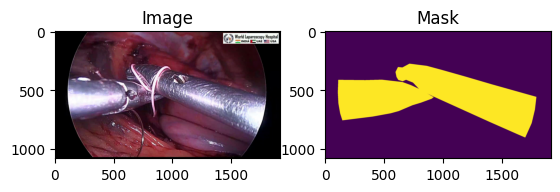

In [ ]:
plt.subplot(1,2,1)
plt.imshow(tf.io.decode_jpeg(tf.io.read_file(train_images[100])))
plt.title("Image")

plt.subplot(1,2,2)
plt.imshow(tf.io.decode_png(tf.io.read_file(train_masks[100]))[:,:,0])
plt.title("Mask")
plt.show()

In [ ]:
def _bytes_feature(value):
    return tf.train.Feature(bytes_list=tf.train.BytesList(value=[value]))

def _int64_feature(value):
    return tf.train.Feature(int64_list=tf.train.Int64List(value=[value]))

In [ ]:
def process_image_mask(image_path, mask_path):
    # --- Read raw files ---
    image_bytes = tf.io.read_file(image_path)
    mask_bytes  = tf.io.read_file(mask_path)

    # --- Decode for shape only ---
    image = tf.io.decode_jpeg(image_bytes, channels=3)
    height = image.shape[0]
    width  = image.shape[1]

    # --- Decode mask (single channel) ---
    mask = tf.io.decode_png(mask_bytes, channels=1)

    # OPTIONAL: ensure 0-based labels
    # mask = mask - 1   # uncomment ONLY if your masks start at 1

    # --- Re-encode mask as PNG ---
    mask_encoded = tf.io.encode_png(tf.cast(mask, tf.uint8)).numpy()

    features = {
        "image/encoded": _bytes_feature(image_bytes.numpy()),
        "image/height":  _int64_feature(height),
        "image/width":   _int64_feature(width),
        "image/segmentation/class/encoded": _bytes_feature(mask_encoded),
    }

    return tf.train.Example(features=tf.train.Features(feature=features))

In [ ]:
def write_tfrecords_from_lists(
    image_paths,
    mask_paths,
    output_path,
    num_shards=1,
    log_every=100
):
    writers = [
        tf.io.TFRecordWriter(
            f"{output_path}-{i:05d}-of-{num_shards:05d}.tfrecord"
        )
        for i in range(num_shards)
    ]

    for idx, (img_p, msk_p) in enumerate(zip(image_paths, mask_paths)):
        if idx % log_every == 0:
            print(f"On image {idx}")

        example = process_image_mask(img_p, msk_p)
        writers[idx % num_shards].write(example.SerializeToString())

    for w in writers:
        w.close()

In [ ]:
output_dir = "/content/gdrive/MyDrive/Tensorflow-Models/datasets/surgical_instruments/surgical_tfrecords"
os.makedirs(output_dir, exist_ok=True)

write_tfrecords_from_lists(
    train_images,
    train_masks,
    os.path.join(output_dir, "train"),
    num_shards=10
)

write_tfrecords_from_lists(
    valid_images,
    valid_masks,
    os.path.join(output_dir, "val"),
    num_shards=5
)

On image 0
On image 100
On image 200
On image 300
On image 400
On image 500
On image 600
On image 700
On image 800
On image 900
On image 1000
On image 1100
On image 1200
On image 1300
On image 1400
On image 1500
On image 1600
On image 1700
On image 1800
On image 1900
On image 2000
On image 2100
On image 2200
On image 2300
On image 2400
On image 2500
On image 2600
On image 0
On image 100
On image 200
On image 300
On image 400
On image 500
On image 600
On image 700
On image 800


In [9]:
train_data_tfrecords = '/content/gdrive/MyDrive/Tensorflow-Models/datasets/surgical_instruments/surgical_tfrecords/train*'
val_data_tfrecords = '/content/gdrive/MyDrive/Tensorflow-Models/datasets/surgical_instruments/surgical_tfrecords/val*'
model_dir = './semantic_trained_model/'
export_dir = './semantic_exported_model/'

In [10]:
if not os.path.exists(model_dir):
  os.mkdir(model_dir)

In [11]:
exp_config = tfm.core.exp_factory.get_exp_config('mnv2_deeplabv3_pascal')

In [13]:
model_ckpt_path = './model_ckpt/'
if not os.path.exists(model_ckpt_path):
  os.mkdir(model_ckpt_path)

!gsutil cp gs://tf_model_garden/cloud/vision-2.0/deeplab/deeplabv3_mobilenetv2_coco/best_ckpt-63.data-00000-of-00001 './model_ckpt/'
!gsutil cp gs://tf_model_garden/cloud/vision-2.0/deeplab/deeplabv3_mobilenetv2_coco/best_ckpt-63.index './model_ckpt/'

Copying gs://tf_model_garden/cloud/vision-2.0/deeplab/deeplabv3_mobilenetv2_coco/best_ckpt-63.data-00000-of-00001...
| [1 files][ 28.2 MiB/ 28.2 MiB]                                                
Operation completed over 1 objects/28.2 MiB.                                     
Copying gs://tf_model_garden/cloud/vision-2.0/deeplab/deeplabv3_mobilenetv2_coco/best_ckpt-63.index...
/ [1 files][ 12.5 KiB/ 12.5 KiB]                                                
Operation completed over 1 objects/12.5 KiB.                                     


In [14]:
num_classes = 7  # 6 tools + background
WIDTH, HEIGHT = 512, 512
input_size = [HEIGHT, WIDTH, 3]
BATCH_SIZE = 8

# Backbone Config
exp_config.task.init_checkpoint = model_ckpt_path + 'best_ckpt-63'
exp_config.task.freeze_backbone = True

# Model Config
exp_config.task.model.num_classes = num_classes
exp_config.task.model.input_size = input_size

# Training Data Config
exp_config.task.train_data.aug_scale_min = 1.0
exp_config.task.train_data.aug_scale_max = 1.0
exp_config.task.train_data.input_path = train_data_tfrecords
exp_config.task.train_data.global_batch_size = BATCH_SIZE
exp_config.task.train_data.dtype = 'float32'
exp_config.task.train_data.output_size = [HEIGHT, WIDTH]
exp_config.task.train_data.preserve_aspect_ratio = False
exp_config.task.train_data.seed = 21 # Reproducable Training Data

# Validation Data Config
exp_config.task.validation_data.input_path = val_data_tfrecords
exp_config.task.validation_data.global_batch_size = BATCH_SIZE
exp_config.task.validation_data.dtype = 'float32'
exp_config.task.validation_data.output_size = [HEIGHT, WIDTH]
exp_config.task.validation_data.preserve_aspect_ratio = False
exp_config.task.validation_data.groundtruth_padded_size = [HEIGHT, WIDTH]
exp_config.task.validation_data.seed = 21 # Reproducable Validation Data
exp_config.task.validation_data.resize_eval_groundtruth = True # To enable validation loss

In [15]:
logical_device_names = [logical_device.name
                        for logical_device in tf.config.list_logical_devices()]

if 'GPU' in ''.join(logical_device_names):
  print('This may be broken in Colab.')
  device = 'GPU'
elif 'TPU' in ''.join(logical_device_names):
  print('This may be broken in Colab.')
  device = 'TPU'
else:
  print('Running on CPU is slow, so only train for a few steps.')
  device = 'CPU'

train_steps = 3370
exp_config.trainer.steps_per_loop = 337 # steps_per_loop = num_of_training_examples // train_batch_size

exp_config.trainer.summary_interval = 337
exp_config.trainer.checkpoint_interval = 337
exp_config.trainer.validation_interval = 337
exp_config.trainer.validation_steps =  101 # validation_steps = num_of_validation_examples // eval_batch_size
exp_config.trainer.train_steps = train_steps
exp_config.trainer.optimizer_config.warmup.linear.warmup_steps = 337
exp_config.trainer.optimizer_config.learning_rate.type = 'cosine'
exp_config.trainer.optimizer_config.learning_rate.cosine.decay_steps = train_steps
exp_config.trainer.optimizer_config.learning_rate.cosine.initial_learning_rate = 0.1
exp_config.trainer.optimizer_config.warmup.linear.warmup_learning_rate = 0.05

This may be broken in Colab.


In [17]:
pp.pprint(exp_config.as_dict())
display.Javascript('google.colab.output.setIframeHeight("500px");')

{   'runtime': {   'all_reduce_alg': None,
                   'batchnorm_spatial_persistent': False,
                   'dataset_num_private_threads': None,
                   'default_shard_dim': -1,
                   'distribution_strategy': 'mirrored',
                   'enable_xla': False,
                   'gpu_thread_mode': None,
                   'loss_scale': None,
                   'mixed_precision_dtype': None,
                   'num_cores_per_replica': 1,
                   'num_gpus': 0,
                   'num_packs': 1,
                   'per_gpu_thread_count': 0,
                   'run_eagerly': False,
                   'task_index': -1,
                   'tpu': None,
                   'tpu_enable_xla_dynamic_padder': None,
                   'use_tpu_mp_strategy': False,
                   'worker_hosts': None},
    'task': {   'allow_image_summary': True,
                'differential_privacy_config': None,
                'eval_input_partition_dims': [],
  

<IPython.core.display.Javascript object>

In [18]:
# Setting up the Strategy
if exp_config.runtime.mixed_precision_dtype == tf.float16:
    tf.keras.mixed_precision.set_global_policy('mixed_float16')

if 'GPU' in ''.join(logical_device_names):
  distribution_strategy = tf.distribute.MirroredStrategy()
elif 'TPU' in ''.join(logical_device_names):
  tf.tpu.experimental.initialize_tpu_system()
  tpu = tf.distribute.cluster_resolver.TPUClusterResolver(tpu='/device:TPU_SYSTEM:0')
  distribution_strategy = tf.distribute.experimental.TPUStrategy(tpu)
else:
  print('Warning: this will be really slow.')
  distribution_strategy = tf.distribute.OneDeviceStrategy(logical_device_names[0])

print("Done")

Done


In [19]:
with distribution_strategy.scope():
  task = tfm.core.task_factory.get_task(exp_config.task, logging_dir=model_dir)

In [20]:
for images, masks in task.build_inputs(exp_config.task.train_data).take(1):
  print()
  print(f'images.shape: {str(images.shape):16}  images.dtype: {images.dtype!r}')
  print(f'masks.shape: {str(masks["masks"].shape):16} images.dtype: {masks["masks"].dtype!r}')


images.shape: (8, 512, 512, 3)  images.dtype: tf.float32
masks.shape: (8, 512, 512, 1) images.dtype: tf.float32


In [21]:
def plot_masks(display_list):
  plt.figure(figsize=(8, 8))

  title = ['Input Image', 'True Mask', 'Predicted Mask']

  for i in range(len(display_list)):
    plt.subplot(1, len(display_list), i+1)
    plt.title(title[i])
    plt.imshow(tf.keras.utils.array_to_img(display_list[i]))
    plt.axis('off')
  plt.show()

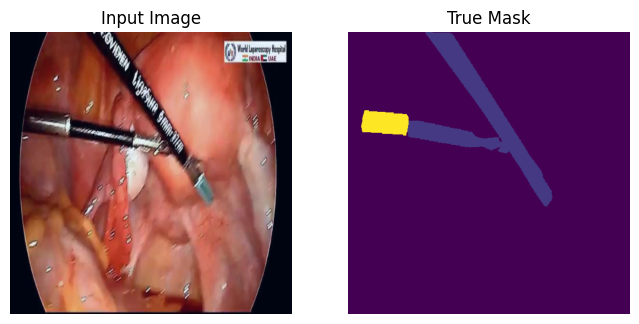

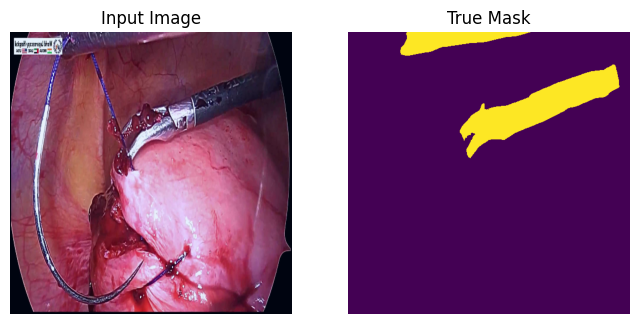

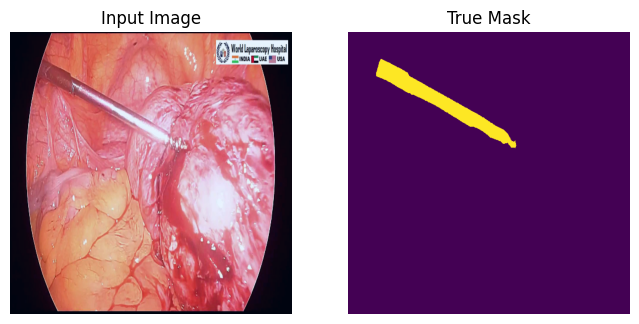

In [ ]:
num_examples = 3

for images, masks in task.build_inputs(exp_config.task.train_data).shuffle(buffer_size=20).take(num_examples):
  plot_masks([images[0], masks['masks'][0]])

In [ ]:
model, eval_logs = tfm.core.train_lib.run_experiment(
    distribution_strategy=distribution_strategy,
    task=task,
    mode='train_and_eval',
    params=exp_config,
    model_dir=model_dir,
    eval_summary_manager=summary_manager.maybe_build_eval_summary_manager(
              params=exp_config, model_dir=model_dir),
    run_post_eval=True)

restoring or initializing model...
train | step:      0 | training until step 337...


train | step:    337 | steps/sec:    1.5 | output: 
    {'learning_rate': 0.09755283,
     'mean_iou': 0.34521362,
     'training_loss': 0.2227678}
saved checkpoint to ./semantic_trained_model/ckpt-337.
 eval | step:    337 | running 101 steps of evaluation...


Instructions for updating:
back_prop=False is deprecated. Consider using tf.stop_gradient instead.
Instead of:
results = tf.map_fn(fn, elems, back_prop=False)
Use:
results = tf.nest.map_structure(tf.stop_gradient, tf.map_fn(fn, elems))
Instructions for updating:
tf.py_func is deprecated in TF V2. Instead, there are two
    options available in V2.
    - tf.py_function takes a python function which manipulates tf eager
    tensors instead of numpy arrays. It's easy to convert a tf eager tensor to
    an ndarray (just call tensor.numpy()) but having access to eager tensors
    means `tf.py_function`s can use accelerators such as GPUs as well as
    being differentiable using a gradient tape.
    - tf.numpy_function maintains the semantics of the deprecated tf.py_func
    (it is not differentiable, and manipulates numpy arrays). It drops the
    stateful argument making all functions stateful.
    


 eval | step:    337 | steps/sec:    1.2 | eval time:   84.7 sec | output: 
    {'best_mean_iou': 0.47854567,
     'image/validation_outputs/0': array([[[[ 96,  99, 102],
             [ 96,  99, 102],
             [ 96,  99, 102],
             ...,
             [ 96,  99, 102],
             [ 96,  99, 102],
             [ 96,  99, 102]],
    
            [[ 96,  99, 102],
             [ 96,  99, 102],
             [ 96,  99, 102],
             ...,
             [ 96,  99, 102],
             [ 96,  99, 102],
             [ 96,  99, 102]],
    
            [[ 96,  99, 102],
             [ 96,  99, 102],
             [ 96,  99, 102],
             ...,
             [ 96,  99, 102],
             [ 96,  99, 102],
             [ 96,  99, 102]],
    
            ...,
    
            [[ 96,  99, 102],
             [ 96,  99, 102],
             [ 96,  99, 102],
             ...,
             [ 96,  99, 102],
             [ 96,  99, 102],
             [ 96,  99, 102]],
    
            [[ 96,  9

In [ ]:
%load_ext tensorboard
%tensorboard --logdir './semantic_trained_model'

<IPython.core.display.Javascript object>

In [ ]:
export_saved_model_lib.export_inference_graph(
    input_type='image_tensor',
    batch_size=1,
    input_image_size=[HEIGHT, WIDTH],
    params=exp_config,
    checkpoint_path=tf.train.latest_checkpoint(model_dir),
    export_dir=export_dir)

In [ ]:
imported = tf.saved_model.load(export_dir)
model_fn = imported.signatures['serving_default']

In [ ]:
def parse(image_path, mask_path):
    image = tf.io.decode_jpeg(tf.io.read_file(image_path), channels=3)
    mask  = tf.io.decode_png(tf.io.read_file(mask_path), channels=1)
    return {
        "image": image,
        "segmentation_mask": mask
    }
val_ds = tf.data.Dataset.from_tensor_slices(
    (valid_images, valid_masks)
).map(parse)

In [22]:
id2color = {
    0: (0, 0, 0),          # background - black
    1: (255, 0, 0),        # red
    2: (0, 255, 0),        # green
    3: (0, 0, 255),        # blue
    4: (255, 255, 0),      # yellow
    5: (255, 0, 255),      # magenta
    6: (0, 255, 255),      # cyan
}

In [23]:
def plot_masks(display_list):
    plt.figure(figsize=(20, 5))
    title = ['Input Image', 'True Mask', 'Predicted Mask', 'Overlay']

    for i in range(len(display_list)):
        plt.subplot(1, len(display_list), i + 1)
        plt.title(title[i])
        plt.imshow(display_list[i])
        plt.axis('off')

    plt.show()

def create_mask(pred_mask):
  pred_mask = tf.math.argmax(pred_mask, axis=-1)
  pred_mask = pred_mask[..., tf.newaxis]
  return pred_mask[0]

def overlay_mask(image, color_mask, alpha=0.5):
    """
    image: (H, W, 3), uint8
    color_mask: (H, W, 3), uint8
    """
    image = tf.cast(image, tf.float32)
    color_mask = tf.cast(color_mask, tf.float32)

    overlay = (1 - alpha) * image + alpha * color_mask
    return tf.cast(overlay, tf.uint8)

def colorize_mask(mask, id2color):
    """
    mask: (H, W, 1) or (H, W), int
    returns: (H, W, 3), uint8
    """
    mask = tf.squeeze(mask, axis=-1)  # (H, W)

    color_mask = tf.zeros(
        (tf.shape(mask)[0], tf.shape(mask)[1], 3),
        dtype=tf.uint8
    )

    for k, v in id2color.items():
        color = tf.constant(v, dtype=tf.uint8)
        color_mask = tf.where(
            tf.expand_dims(mask == k, axis=-1),
            color,
            color_mask
        )

    return color_mask

In [ ]:
for record in val_ds.shuffle(buffer_size=20).take(15):
    image = tf.image.resize(record['image'], size=[HEIGHT, WIDTH])
    image = tf.cast(image, tf.uint8)

    mask = tf.image.resize(
        record['segmentation_mask'],
        size=[HEIGHT, WIDTH],
        method="nearest"
    )

    predicted_mask = model_fn(tf.expand_dims(record['image'], axis=0))
    pred_mask = create_mask(predicted_mask['logits'])

    gt_color   = colorize_mask(mask, id2color)
    pred_color = colorize_mask(pred_mask, id2color)

    overlay = overlay_mask(image, pred_color, alpha=0.5)

    plot_masks([
        image,
        gt_color,
        pred_color,
        overlay,
    ])

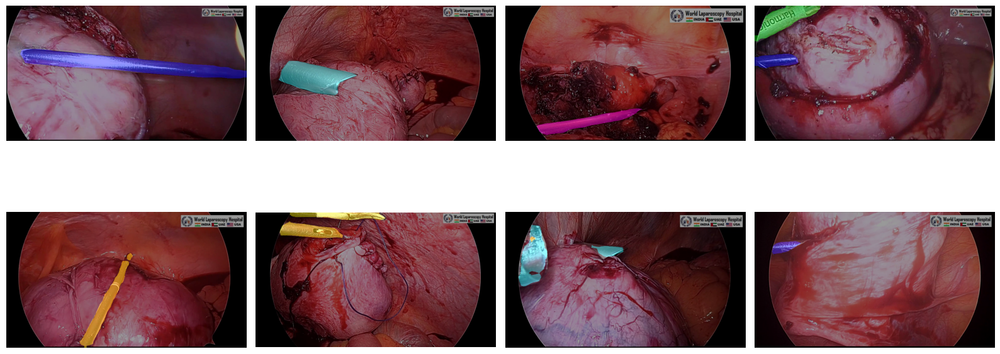

In [ ]:
import os, random, cv2
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt

# ---------------- CONFIG ----------------
val_dir = "/content/gdrive/MyDrive/Tensorflow-Models/datasets/surgical_instruments/images/valid"

N = 8
cols = 4
rows = int(np.ceil(N / cols))
INPUT_SIZE = (512, 512)
# ----------------------------------------

# collect images
all_imgs = [
    os.path.join(val_dir, f)
    for f in os.listdir(val_dir)
    if f.lower().endswith((".jpg", ".png", ".jpeg"))
]

sample_imgs = random.sample(all_imgs, N)

# ---------------- LOAD IMAGES ----------------
orig_images = []
model_images = []
orig_sizes = []

for p in sample_imgs:
    img_bgr = cv2.imread(p)
    img_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)

    h, w = img_rgb.shape[:2]
    orig_sizes.append((h, w))
    orig_images.append(img_rgb)

    img_resized = cv2.resize(img_rgb, INPUT_SIZE, interpolation=cv2.INTER_LINEAR)
    model_images.append(img_resized.astype(np.float32) / 255.0)

model_images = np.array(model_images)  # (N, 512, 512, 3)

preds = []

for img in model_images:
    img_uint8 = (img * 255).astype(np.uint8)
    out = model_fn(inputs=tf.expand_dims(img_uint8, axis=0))
    logits = out["logits"]
    pred = tf.argmax(logits, axis=-1)[0].numpy()
    preds.append(pred)

preds = np.array(preds)  # (N, 512, 512)

def decode_mask(mask, id2color):
    h, w = mask.shape
    color_mask = np.zeros((h, w, 3), dtype=np.uint8)
    for k, v in id2color.items():
        color_mask[mask == k] = v
    return color_mask

plt.figure(figsize=(4 * cols, 4 * rows))

for i, (img, pr, (h, w)) in enumerate(zip(orig_images, preds, orig_sizes)):
    pr_resized = cv2.resize(pr, (w, h), interpolation=cv2.INTER_NEAREST)
    color_mask = decode_mask(pr_resized, id2color)

    overlay = (0.6 * img + 0.4 * color_mask).astype(np.uint8)

    plt.subplot(rows, cols, i + 1)
    plt.imshow(overlay)
    plt.axis("off")

plt.tight_layout()
plt.show()

In [ ]:
# Serialize the model as a SavedModel.
# Use model.export for Keras models

# Convert to TFLite. This form of quantization is called
# post-training dynamic-range quantization in TFLite.
converter = tf.lite.TFLiteConverter.from_saved_model("semantic_exported_model")

# Enable TF Select ops for unsupported operations
converter.target_spec.supported_ops = [
    tf.lite.OpsSet.TFLITE_BUILTINS,
    tf.lite.OpsSet.SELECT_TF_OPS # Enable TF Select ops
]

# No optimizations
tflite_model = converter.convert()
open("deeplabv3_SIS.tflite", "wb").write(tflite_model)

/usr/local/lib/python3.11/dist-packages/tensorflow/lite/python/interpreter.py:457: UserWarning:     Warning: tf.lite.Interpreter is deprecated and is scheduled for deletion in
    TF 2.20. Please use the LiteRT interpreter from the ai_edge_litert package.
    See the [migration guide](https://ai.google.dev/edge/litert/migration)
    for details.
    
  warnings.warn(_INTERPRETER_DELETION_WARNING)


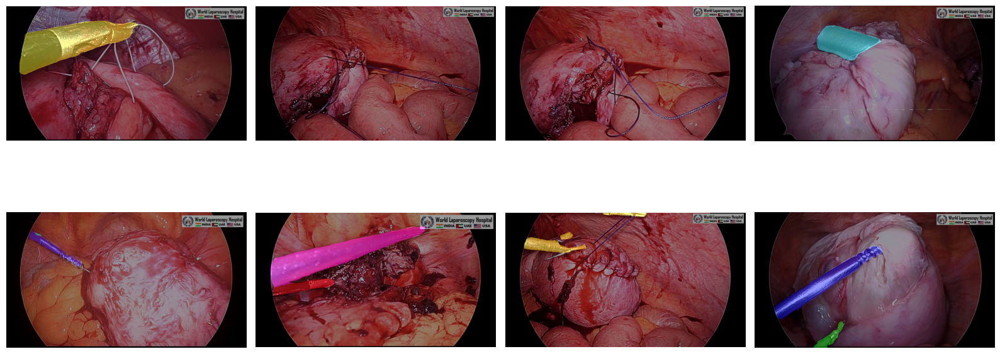

In [ ]:
import os, random, cv2
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt

# ---------------- CONFIG ----------------
val_dir = "/content/gdrive/MyDrive/Tensorflow-Models/datasets/surgical_instruments/images/valid"

N = 8
cols = 4
rows = int(np.ceil(N / cols))
INPUT_SIZE = (512, 512)

# ---------- LOAD TFLITE ----------
interpreter = tf.lite.Interpreter(
    model_path="deeplabv3_SIS.tflite"
)
interpreter.allocate_tensors()

input_details = interpreter.get_input_details()
output_details = interpreter.get_output_details()

# ---- FIX MODEL INPUT SHAPE (ONCE) ----
MODEL_H = 512   # MUST match training
MODEL_W = 512

interpreter.resize_tensor_input(
    input_details[0]["index"],
    [1, MODEL_H, MODEL_W, 3],
    strict=True
)
interpreter.allocate_tensors()

input_details = interpreter.get_input_details()
output_details = interpreter.get_output_details()
# ----------------------------------------

# collect images
all_imgs = [
    os.path.join(val_dir, f)
    for f in os.listdir(val_dir)
    if f.lower().endswith((".jpg", ".png", ".jpeg"))
]

sample_imgs = random.sample(all_imgs, N)

# ---------------- LOAD IMAGES ----------------
orig_images = []
model_images = []
orig_sizes = []

for p in sample_imgs:
    img_bgr = cv2.imread(p)
    img_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)

    h, w = img_rgb.shape[:2]
    orig_sizes.append((h, w))
    orig_images.append(img_rgb)

    img_resized = cv2.resize(img_rgb, INPUT_SIZE, interpolation=cv2.INTER_LINEAR)
    model_images.append(img_resized.astype(np.float32) / 255.0)

model_images = np.array(model_images)  # (N, 512, 512, 3)

# ---------------- INFERENCE (TFLITE, SINGLE IMAGE) ----------------
all_preds = []

for img in model_images:
    # add batch dimension
    input_tensor = np.expand_dims(img * 255, axis=0).astype(np.uint8)

    interpreter.set_tensor(input_details[0]["index"], input_tensor)
    interpreter.invoke()

    output = interpreter.get_tensor(output_details[0]["index"])  # (1, 512, 512, C)
    output = np.array(output)
    output = np.argmax(output, axis=-1)
    all_preds.append(output[0])  # remove batch dim

def decode_mask(mask, id2color):
    h, w = mask.shape
    color_mask = np.zeros((h, w, 3), dtype=np.uint8)
    for k, v in id2color.items():
        color_mask[mask == k] = v
    return color_mask

plt.figure(figsize=(4 * cols, 4 * rows))

for i, (img, pr, (h, w)) in enumerate(zip(orig_images, all_preds, orig_sizes)):
    pr_resized = cv2.resize(pr, (w, h), interpolation=cv2.INTER_NEAREST)
    color_mask = decode_mask(pr_resized, id2color)

    overlay = (0.6 * img + 0.4 * color_mask).astype(np.uint8)

    plt.subplot(rows, cols, i + 1)
    plt.imshow(overlay)
    plt.axis("off")

plt.tight_layout()
plt.show()

In [24]:
def draw_contours(img, mask, id2color, thickness=2):
    """
    img: (H, W, 3) RGB uint8
    mask: (H, W) int
    """
    out = img.copy()

    for cls_id, color in id2color.items():
        if cls_id == 0:
            continue  # skip background

        bin_mask = (mask == cls_id).astype(np.uint8) * 255
        if bin_mask.max() == 0:
            continue

        contours, _ = cv2.findContours(
            bin_mask,
            cv2.RETR_EXTERNAL,
            cv2.CHAIN_APPROX_SIMPLE
        )

        cv2.drawContours(
            out,
            contours,
            contourIdx=-1,
            color=color,
            thickness=thickness
        )

    return out

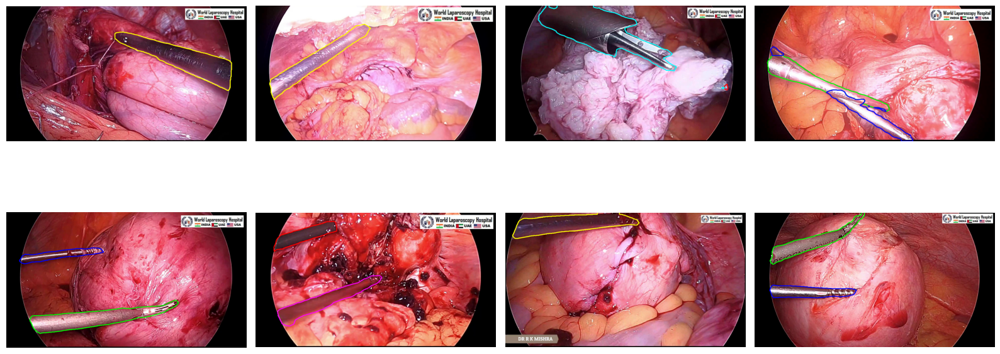

In [26]:
import os, random, cv2
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt

# ---------------- CONFIG ----------------
val_dir = "/content/gdrive/MyDrive/Tensorflow-Models/datasets/surgical_instruments/images/valid"

N = 8
cols = 4
rows = int(np.ceil(N / cols))
INPUT_SIZE = (512, 512)

# ---------- LOAD TFLITE ----------
interpreter = tf.lite.Interpreter(
    model_path="deeplabv3_SIS.tflite"
)
interpreter.allocate_tensors()

input_details = interpreter.get_input_details()
output_details = interpreter.get_output_details()

# ---- FIX MODEL INPUT SHAPE (ONCE) ----
MODEL_H = 512   # MUST match training
MODEL_W = 512

interpreter.resize_tensor_input(
    input_details[0]["index"],
    [1, MODEL_H, MODEL_W, 3],
    strict=True
)
interpreter.allocate_tensors()

input_details = interpreter.get_input_details()
output_details = interpreter.get_output_details()
# ----------------------------------------

# collect images
all_imgs = [
    os.path.join(val_dir, f)
    for f in os.listdir(val_dir)
    if f.lower().endswith((".jpg", ".png", ".jpeg"))
]

sample_imgs = random.sample(all_imgs, N)

# ---------------- LOAD IMAGES ----------------
orig_images = []
model_images = []
orig_sizes = []

for p in sample_imgs:
    img_bgr = cv2.imread(p)
    img_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)

    h, w = img_rgb.shape[:2]
    orig_sizes.append((h, w))
    orig_images.append(img_rgb)

    img_resized = cv2.resize(img_rgb, INPUT_SIZE, interpolation=cv2.INTER_LINEAR)
    model_images.append(img_resized.astype(np.float32) / 255.0)

model_images = np.array(model_images)  # (N, 512, 512, 3)

# ---------------- INFERENCE (TFLITE, SINGLE IMAGE) ----------------
all_preds = []

for img in model_images:
    # add batch dimension
    input_tensor = np.expand_dims(img * 255, axis=0).astype(np.uint8)

    interpreter.set_tensor(input_details[0]["index"], input_tensor)
    interpreter.invoke()

    output = interpreter.get_tensor(output_details[0]["index"])  # (1, 512, 512, C)
    output = np.array(output)
    output = np.argmax(output, axis=-1)
    all_preds.append(output[0])  # remove batch dim

CONTOUR_THICKNESS = 6  # <<< adjust here

plt.figure(figsize=(4 * cols, 4 * rows))

for i, (img, pr, (h, w)) in enumerate(zip(orig_images, all_preds, orig_sizes)):
    pr_resized = cv2.resize(
        pr,
        (w, h),
        interpolation=cv2.INTER_NEAREST
    )

    contour_overlay = draw_contours(
        img,
        pr_resized,
        id2color,
        thickness=CONTOUR_THICKNESS
    )

    plt.subplot(rows, cols, i + 1)
    plt.imshow(contour_overlay)
    plt.axis("off")

plt.tight_layout()
plt.show()